In [ ]:
!pip install autodistill-yolov8

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.0/527.0 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.1/281.1 kB 14.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-man

In [ ]:
!pip install ultralytics==8.0.196

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.1/631.1 kB 1.2 MB/s eta 0:00:00
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.0.81
    Uninstalling ultralytics-8.0.81:
      Successfully uninstalled ultralytics-8.0.81
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autodistill-yolov8 0.1.4 requires ultralytics==8.0.81, but you have ultralytics 8.0.196 which is incompatible.


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="j1l5zpfb6XMyUr89KNZs")
project = rf.workspace("fire-detection-ie6qw").project("fire-detection-ro7s6")
version = project.version(2)
dataset = version.download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.9/74.9 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 34.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.5 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Fire-Detection-2 in yolov8:: 100%|██████████| 12080/12080 [00:01<00:00, 7121.26it/s]


In [ ]:
from autodistill.detection import CaptionOntology
from autodistill_yolov8 import YOLOv8
from IPython.display import Image
import os
os.environ['MKL_THREADING_LAYER'] = 'GNU'

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=50 imgsz=640 plots=True batch=32

/content
100% 49.7M/49.7M [00:00<00:00, 410MB/s]
New https://pypi.org/project/ultralytics/8.2.17 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/datasets/Fire-Detection-2/data.yaml, epochs=50, patience=50, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream

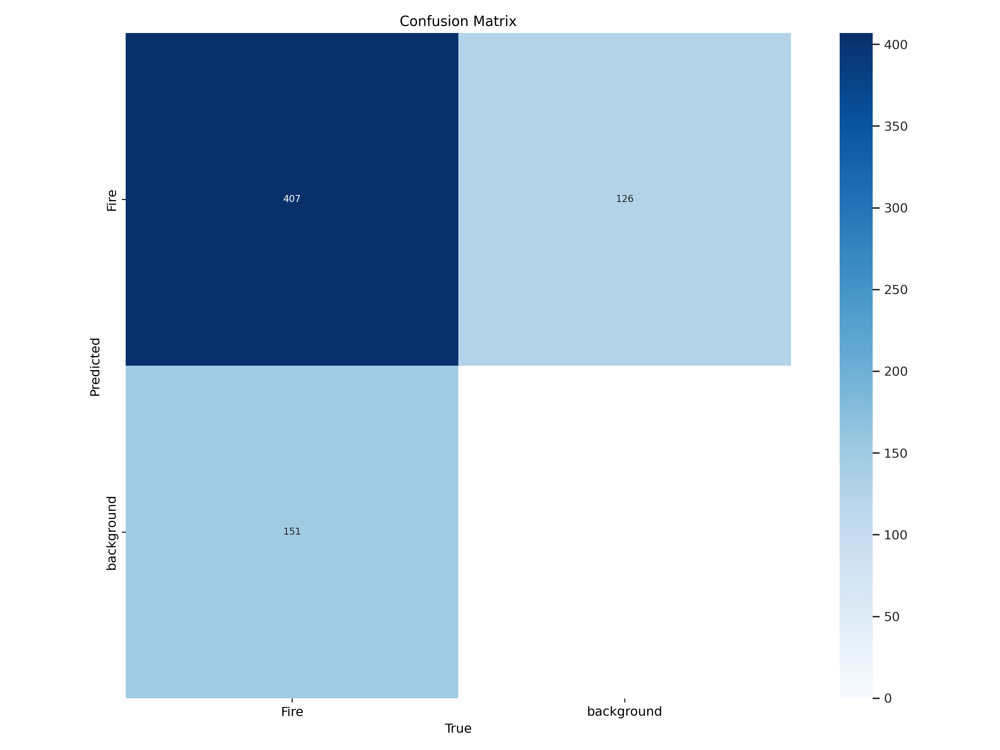

In [ ]:
Image(filename='./runs/detect/train/confusion_matrix.png', width=600)

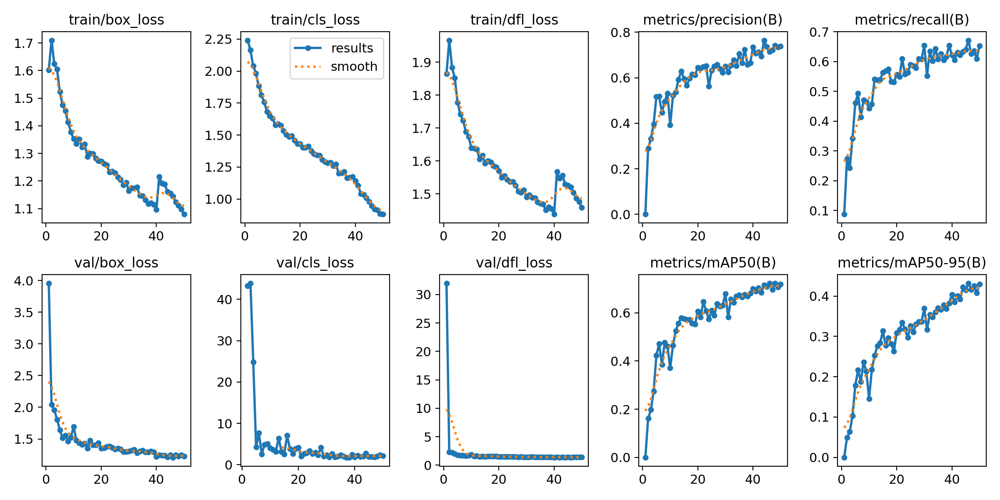

In [ ]:
Image(filename='./runs/detect/train/results.png', width=600)

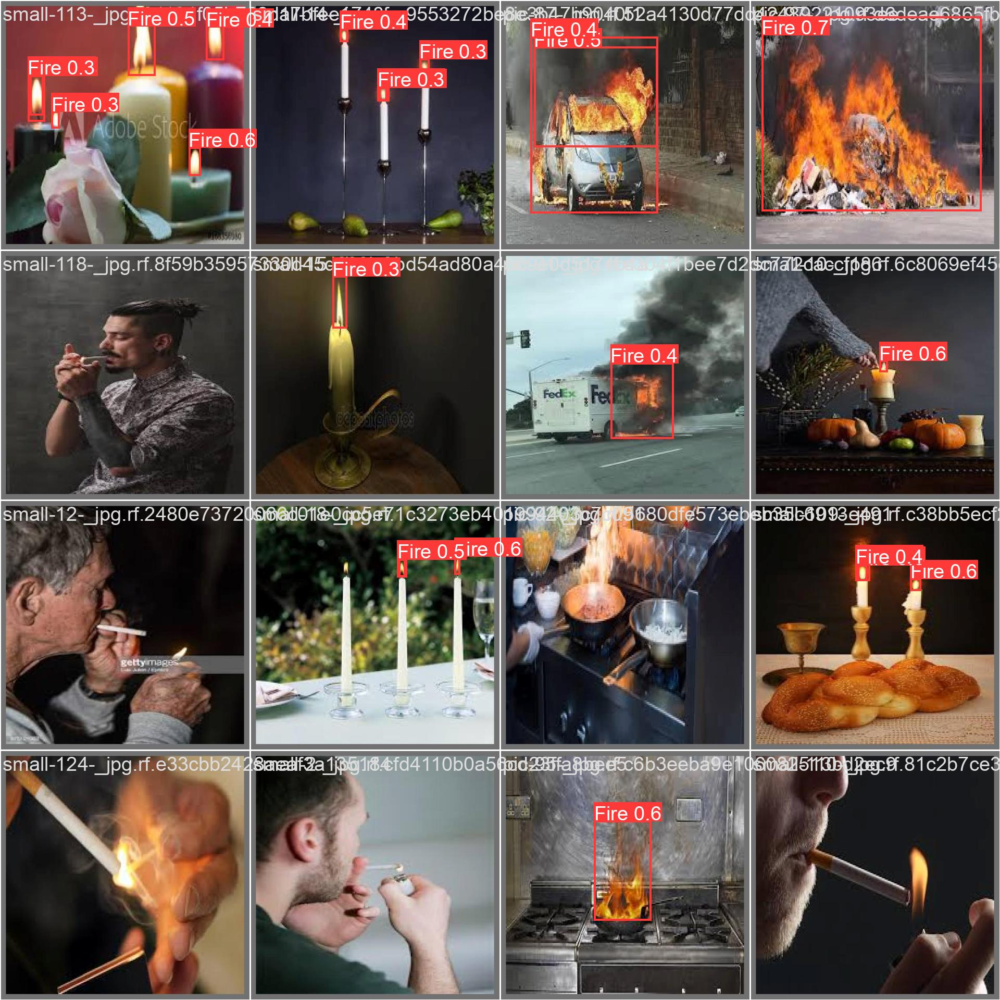

In [ ]:
Image(filename='./runs/detect/train/val_batch0_pred.jpg', width=600)

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/datasets/Fire-Detection-2/valid/labels.cache... 654 images, 200 backgrounds, 0 corrupt: 100% 654/654 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1, len(boxes) = 558. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 41/41 [00:17<00:00,  2.31it/s]
                   all        654        558      0.7

In [ ]:
!unzip image.zip

Streaming output truncated to the last 5000 lines.
  inflating: image/fire_0469_jpg.rf.4a053fcbee27c74182cd922ea85f4540.jpg  
  inflating: image/fire_0469_jpg.rf.5958aafaff49de88fd3a39d208a0fa8e.jpg  
  inflating: image/fire_0470_jpg.rf.6eda4b2b765a73030dcfa7e57ecae5da.jpg  
  inflating: image/fire_0470_jpg.rf.daef6d45ce773cce386e435e32bb64c9.jpg  
  inflating: image/fire_0470_jpg.rf.ed9600cc88ce482f8a28f196f845bdae.jpg  
  inflating: image/fire_0471_jpg.rf.880e62d2a92128b35fb63fa68567c313.jpg  
  inflating: image/fire_0472_jpg.rf.159ae7f58017e86dc9ade49741ee035a.jpg  
  inflating: image/fire_0472_jpg.rf.2cb15daa4225c6843a2ecac5e94049be.jpg  
  inflating: image/fire_0472_jpg.rf.8795a1af9fa90bfe0797243bd7d0988b.jpg  
  inflating: image/fire_0473_jpg.rf.184ef3c85bec1d58e5a3b8b31544820f.jpg  
  inflating: image/fire_0473_jpg.rf.205ef8201668ccf0b514b9829d061fe8.jpg  
  inflating: image/fire_0473_jpg.rf.b814180554a14f02718f702a01601c78.jpg  
  inflating: image/fire_0474_jpg.rf.1b825b4be7b03

In [ ]:
from autodistill_yolov8 import YOLOv8Base
from autodistill.detection import CaptionOntology

%cd {HOME}
# replace weights_path with the path to your YOLOv8 weights file and change ontology
base_model = YOLOv8Base(ontology=CaptionOntology({ "Fire" : "Fire"}), weights_path="/content/runs/detect/train/weights/best.pt")

/content


In [ ]:
%cd {HOME}

base_model.label(
  input_folder="/content/image", #Copy path from colab
  output_folder="./labeled"
)

/content


Streaming output truncated to the last 5000 lines.
Speed: 2.7ms preprocess, 18.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Labeling /content/image/Fire_14_jpg.rf.a036cd755ddecff2f0b2b42ab3ef3344.jpg:  72%|███████▏  | 4368/6034 [02:41<00:59, 27.82it/s] 
0: 640x640 1 Fire, 18.7ms
Speed: 3.0ms preprocess, 18.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Labeling /content/image/fire_0580_jpg.rf.13576c657cb44624e3e6d6ce16e95426.jpg:  72%|███████▏  | 4368/6034 [02:41<00:59, 27.82it/s]
0: 640x640 1 Fire, 18.4ms
Speed: 2.6ms preprocess, 18.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Labeling /content/image/fire_0337_jpg.rf.00362d86f2a95037cb3418159f771222.jpg:  72%|███████▏  | 4368/6034 [02:41<00:59, 27.82it/s]
0: 640x640 1 Fire, 18.5ms
Speed: 2.6ms preprocess, 18.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Labeling /content/image/fire_0789_jpg.rf.6363a0d0d32bf8daf918391bcebe7196.jpg:  72%|███████

Labeled dataset created - ready for distillation.


DetectionDataset(classes=['Fire'], images={'nofire_0342_jpg.rf.b10bc35cfefab016ea9d825fdc564877.jpg': array([[[236, 253, 250],
        [236, 253, 250],
        [238, 252, 250],
        ...,
        [ 60,  75,  71],
        [ 60,  75,  71],
        [ 60,  75,  71]],

       [[236, 253, 250],
        [236, 253, 250],
        [238, 252, 250],
        ...,
        [ 59,  74,  70],
        [ 59,  74,  70],
        [ 59,  74,  70]],

       [[238, 252, 250],
        [238, 252, 250],
        [238, 252, 250],
        ...,
        [ 61,  76,  72],
        [ 60,  75,  71],
        [ 60,  75,  71]],

       ...,

       [[ 54,  76,  74],
        [ 51,  73,  71],
        [ 46,  68,  66],
        ...,
        [ 50,  55,  54],
        [ 50,  55,  54],
        [ 50,  55,  54]],

       [[ 56,  78,  76],
        [ 53,  75,  73],
        [ 48,  70,  68],
        ...,
        [ 50,  55,  54],
        [ 51,  56,  55],
        [ 51,  56,  55]],

       [[ 57,  79,  77],
        [ 54,  76,  74],
        [ 

In [14]:
import shutil
import os

# Path to the folder you want to zip
folder_path = '/content/labeled'

# Path for the zip file
zip_file_path = '/content/labeled.zip'

# Create a zip file containing the folder
shutil.make_archive(zip_file_path.split('.')[0], 'zip', folder_path)

# Download the zip file
from google.colab import files
files.download(zip_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [15]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8n.pt data=/content/labeled/data.yaml epochs=50 imgsz=640 plots=True batch=32

/content
New https://pypi.org/project/ultralytics/8.2.17 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/labeled/data.yaml, epochs=50, patience=50, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=F

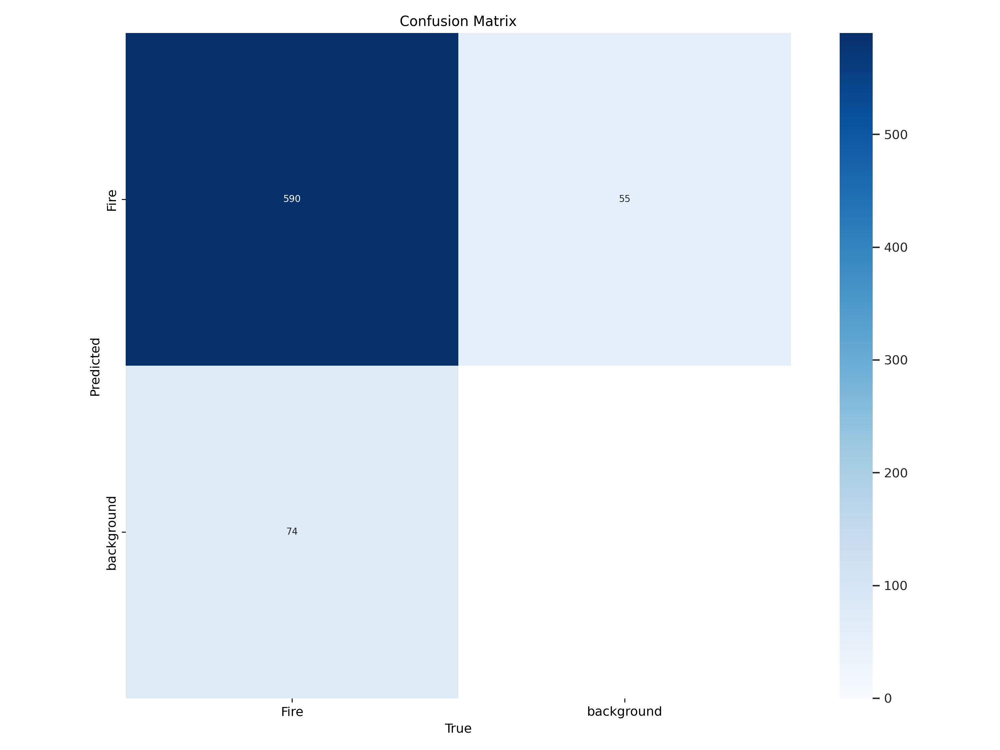

In [16]:
Image(filename='./runs/detect/train2/confusion_matrix.png', width=600)

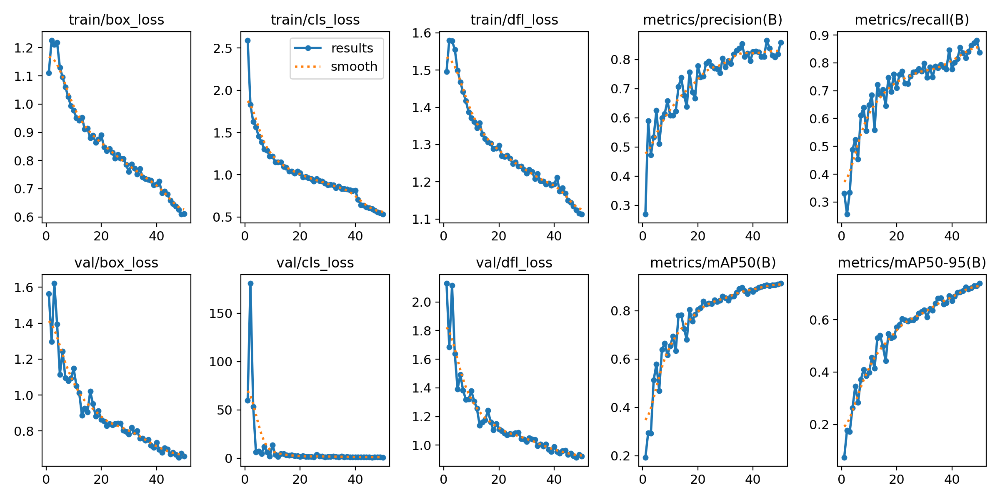

In [17]:
Image(filename='./runs/detect/train2/results.png', width=600)

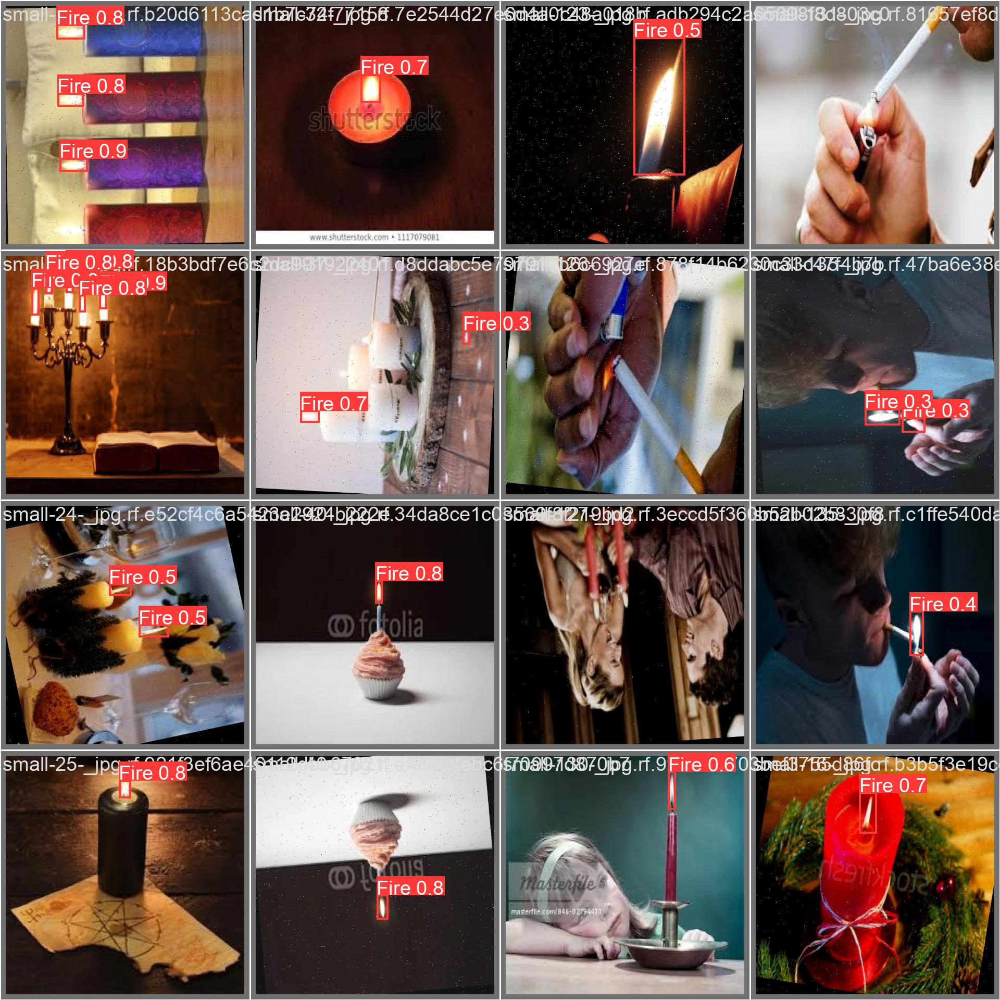

In [18]:
Image(filename='./runs/detect/train2/val_batch0_pred.jpg', width=600)

In [19]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/runs/detect/train2/weights/best.pt data=/content/labeled/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/labeled/valid/labels.cache... 1207 images, 617 backgrounds, 0 corrupt: 100% 1207/1207 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 76/76 [00:09<00:00,  8.07it/s]
                   all       1207        664      0.857      0.837      0.913      0.738
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val2
💡 Learn more at https://docs.ultralytics.com/modes/val


In [20]:
import shutil
import os

# Path to the folder you want to zip
folder_path = '/content/runs/detect'

# Path for the zip file
zip_file_path = '/content/runs/detect.zip'

# Create a zip file containing the folder
shutil.make_archive(zip_file_path.split('.')[0], 'zip', folder_path)

# Download the zip file
from google.colab import files
files.download(zip_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>